# Wine Quality Prediction - Part 3 - Binary Classification

![](https://cdn.pixabay.com/photo/2016/03/09/11/53/wine-glasses-1246240_1280.jpg)

This notebook is part of a trilogy in which I will approach the wine quality dataset from several different approaches:

+ [Part 1: Supervised Learning - Regression](https://www.kaggle.com/sgtsteiner/red-wine-quality-regression)
+ [Part 2: Supervised Learning - Multiclass Classification](https://www.kaggle.com/sgtsteiner/red-wine-quality-multiclass-classification)
+ [Part 3: Supervised Learning - Binary Classification](https://www.kaggle.com/sgtsteiner/red-wine-quality-binary-classification)

In [the first part of this analysis](https://www.kaggle.com/sgtsteiner/red-wine-quality-regression) we approach the problem as supervised learning - regression. The resulting model was not satisfactory to us. [In a second analysis](https://www.kaggle.com/sgtsteiner/red-wine-quality-multiclass-classification), we approach the problem as supervised learning - multiclass classification. Given that the data we had was so unbalanced (the quality scores were concentrated on scores 5 or 6) the performance of our best model (RandomForest) was not quite good. In this third and final part, we will focus our analysis on a **supervised learning - binary classification** problem.

# Imports

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.model_selection import RandomizedSearchCV, cross_val_score 
from sklearn.model_selection import cross_validate, cross_val_predict
from sklearn.linear_model import SGDClassifier
from sklearn.dummy import DummyClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn import metrics, utils

import xgboost as xgb

import pandas_profiling

%matplotlib inline

seed = 42

import warnings
warnings.filterwarnings('ignore')

# Get the data

In [17]:
red = pd.read_csv("../input/red-wine-quality-cortez-et-al-2009/winequality-red.csv")

# Explore the data

In [18]:
red.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [19]:
red.profile_report()

Summarize dataset:   0%|          | 0/26 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

We are not going to delve into data exploration, as we already did in the [first part of this analysis](https://www.kaggle.com/sgtsteiner/red-wine-quality-regression). The only preprocessing that we are going to perform is to convert the target variable `quality` to categorical, indicating whether the score is good or not: `bad`: scores less than or equal to 5. `good`: scores greater than or equal to 6.

In [20]:
bins = [2, 5.5, 8]
labels = ["bad", "good"]
red['quality_cat'] = pd.cut(red['quality'], bins=bins, labels=labels)

In [21]:
red["quality_cat"].value_counts()

good    855
bad     744
Name: quality_cat, dtype: int64

In [22]:
print(f"Percentage of quality scores")
red["quality_cat"].value_counts(normalize=True)*100

Percentage of quality scores


good    53.470919
bad     46.529081
Name: quality_cat, dtype: float64

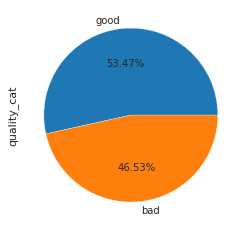

In [23]:
red["quality_cat"].value_counts().plot.pie(autopct='%1.2f%%');

# Select and train models

The goal of this phase is to train many models quickly and unrefined, of different categories (i.e. Random Forests, AdaBoost, Extra Tree, etc.) using the standard parameters. The idea is to have a quick overview of which models are most promising. Measure and compare the performance of all of them. Select the best models.

Create the predictor dataset and the dataset with the target variable:

In [24]:
predict_columns = red.columns[:-2]
predict_columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol'],
      dtype='object')

In [25]:
X = red[predict_columns]
y = red["quality_cat"]

Create the training and test datasets:

In [27]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    random_state=42, 
                                                    test_size=0.2)

## Baseline

First, we are going to train a dummy classifier that we will use as a baseline with which to compare.

In [28]:
clf_dummy = DummyClassifier(strategy="uniform", random_state=seed) # Random prediction
clf_dummy.fit(X_train, y_train)

DummyClassifier(random_state=42, strategy='uniform')

In [29]:
cross_val_score(clf_dummy, X_train, y_train, cv=3, 
                scoring="accuracy", n_jobs=-1).mean()

0.526184428978241

As we can see, a classifier that predicts randomly obtains an accuracy of 53%.

In [30]:
# Always predict the most frequent class
clf_dummy = DummyClassifier(strategy="most_frequent", random_state=seed) 
clf_dummy.fit(X_train, y_train)

DummyClassifier(random_state=42, strategy='most_frequent')

In [31]:
cross_val_score(clf_dummy, X_train, y_train, cv=3, scoring="accuracy", n_jobs=-1).mean()

0.528537344284285

A classifier that always predicts the most frequent class (in our case the `good` quality) also obtains an accuracy of 53%. We are going to take the prediction of this dummy classifier as our baseline.

In [33]:
preds = cross_val_predict(clf_dummy, X_train, y_train, cv=3, n_jobs=-1)

In [34]:
conf_mx = metrics.confusion_matrix(y_train, preds)
conf_mx

array([[  0, 603],
       [  0, 676]])

In [35]:
pd.crosstab(y_train, preds, rownames = ['Actual'], colnames =['Predicción'])

Predicción,good
Actual,
bad,603
good,676


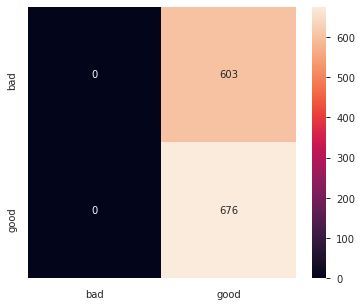

In [36]:
fig = plt.figure(figsize=(6,5))
ax = sns.heatmap(conf_mx, annot=True, fmt="d", 
                 xticklabels=clf_dummy.classes_,
                 yticklabels=clf_dummy.classes_,)

In [37]:
accuracy_base = metrics.accuracy_score(y_train, preds)
precision_base = metrics.precision_score(y_train, preds, 
                                         average='weighted', 
                                         zero_division=0)
recall_base = metrics.recall_score(y_train, preds, 
                                   average='weighted')
f1_base = metrics.f1_score(y_train, preds, 
                           average='weighted')
print(f"Accuracy: {accuracy_base}")
print(f"Precision: {precision_base}")
print(f"Recall: {recall_base}")
print(f"f1: {f1_base}")

Accuracy: 0.5285379202501954
Precision: 0.279352333142402
Recall: 0.5285379202501954
f1: 0.3655157381986006


In [38]:
print(metrics.classification_report(y_train, preds, zero_division=0))

              precision    recall  f1-score   support

         bad       0.00      0.00      0.00       603
        good       0.53      1.00      0.69       676

    accuracy                           0.53      1279
   macro avg       0.26      0.50      0.35      1279
weighted avg       0.28      0.53      0.37      1279



Our dummy classifier is correct only 28% of the time (precision) and detects 53% of the actual scores (recall). It is often convenient to combine precision and sensitivity into a single metric called the F1 score, particularly if we need a simple way to compare two classifiers. The F1 score is the harmonic mean of precision and sensitivity. While the regular mean treats all values equally, the harmonic mean gives much more weight to low values. As a result, the classifier will only score high on F1 if both sensitivity and precision are high. In our case, F1 = 0.37. Okay, let's take these three metrics as our initial baseline.

## Shortlist Promising Models

In [39]:
def evaluate_model(estimator, X_train, y_train, cv=5, verbose=True):
    """Print and return cross validation of model
    """
    scoring = {"accuracy": "accuracy",
               "precision": "precision_weighted",
               "recall": "recall_weighted",
               "f1": "f1_weighted"}
    scores = cross_validate(estimator, X_train, y_train, cv=cv, scoring=scoring)
    
    accuracy, accuracy_std = scores['test_accuracy'].mean(), \
                                scores['test_accuracy'].std()
    
    precision, precision_std = scores['test_precision'].mean(), \
                                scores['test_precision'].std()
    
    recall, recall_std = scores['test_recall'].mean(), \
                                scores['test_recall'].std()
    
    f1, f1_std = scores['test_f1'].mean(), scores['test_f1'].std()

    
    result = {
        "Accuracy": accuracy,
        "Accuracy std": accuracy_std,
        "Precision": precision,
        "Precision std": precision_std,
        "Recall": recall,
        "Recall std": recall_std,
        "f1": f1,
        "f1 std": f1_std,
    }
    
    if verbose:
        print(f"Accuracy: {accuracy} - (std: {accuracy_std})")
        print(f"Precision: {precision} - (std: {precision_std})")
        print(f"Recall: {recall} - (std: {recall_std})")
        print(f"f1: {f1} - (std: {f1_std})")

    return result

In [40]:
models = [GaussianNB(), KNeighborsClassifier(), RandomForestClassifier(random_state=seed),
          DecisionTreeClassifier(random_state=seed), ExtraTreeClassifier(random_state=seed), 
          AdaBoostClassifier(random_state=seed), GradientBoostingClassifier(random_state=seed), 
          xgb.XGBClassifier()]

model_names = ["Naive Bayes Gaussian", "K Neighbors Classifier", "Random Forest",
               "Decision Tree", "Extra Tree", "Ada Boost", 
               "Gradient Boosting", "XGBoost"]

In [41]:
accuracy = []
precision = []
recall = []
f1 = []

for model in range(len(models)):
    print(f"Step {model+1} de {len(models)}")
    print(f"...running {model_names[model]}")
    
    clf_scores = evaluate_model(models[model], X_train, y_train)
    
    accuracy.append(clf_scores["Accuracy"])
    precision.append(clf_scores["Precision"])
    recall.append(clf_scores["Recall"])
    f1.append(clf_scores["f1"])

Step 1 de 8
...running Naive Bayes Gaussian
Accuracy: 0.7201439950980392 - (std: 0.033696990349805715)
Precision: 0.720644486691049 - (std: 0.033593415150853026)
Recall: 0.7201439950980392 - (std: 0.033696990349805715)
f1: 0.7199010649617639 - (std: 0.033643475650199935)
Step 2 de 8
...running K Neighbors Classifier
Accuracy: 0.6317371323529412 - (std: 0.010806791275536434)
Precision: 0.6321889383738446 - (std: 0.01062472453591506)
Recall: 0.6317371323529412 - (std: 0.010806791275536434)
f1: 0.6313065045400401 - (std: 0.010743689929585682)
Step 3 de 8
...running Random Forest
Accuracy: 0.8069178921568627 - (std: 0.02715438960045835)
Precision: 0.8078908276062785 - (std: 0.02716500681069511)
Recall: 0.8069178921568627 - (std: 0.02715438960045835)
f1: 0.8069533526727962 - (std: 0.027156973217689437)
Step 4 de 8
...running Decision Tree
Accuracy: 0.7443443627450981 - (std: 0.02090049502695867)
Precision: 0.7472884660852015 - (std: 0.021372709113593295)
Recall: 0.7443443627450981 - (std: 0

Let's see the performance of each of them:

In [42]:
df_result = pd.DataFrame({"Model": model_names,
                          "accuracy": accuracy,
                          "precision": precision,
                          "recall": recall,
                          "f1": f1})
df_result.sort_values(by="f1", ascending=False)

,Model,accuracy,precision,recall,f1
2,Random Forest,0.806918,0.807891,0.806918,0.806953
7,XGBoost,0.799078,0.799877,0.799078,0.798960
6,Gradient Boosting,0.781103,0.781359,0.781103,0.781026
3,Decision Tree,0.744344,0.747288,0.744344,0.744058
5,Ada Boost,0.740463,0.740732,0.740463,0.740083
4,Extra Tree,0.734979,0.735502,0.734979,0.734919
0,Naive Bayes Gaussian,0.720144,0.720644,0.720144,0.719901
1,K Neighbors Classifier,0.631737,0.632189,0.631737,0.631307


We are going to visualize the comparison of the different models / metrics:

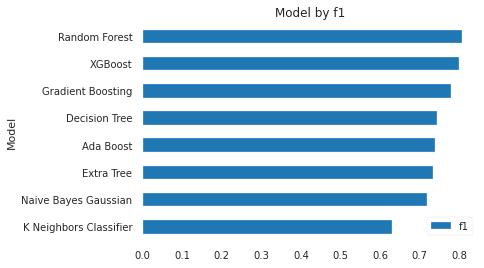

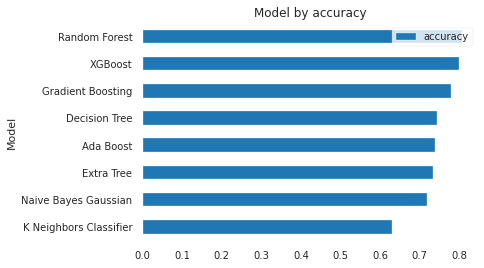

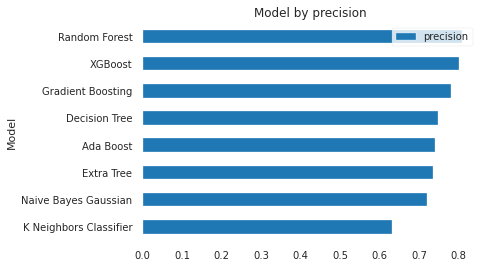

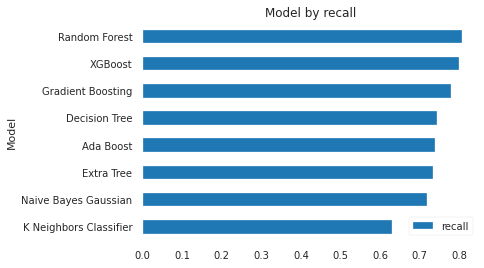

In [43]:
metrics_list = ["f1", "accuracy", "precision", "recall"]

for metric in metrics_list:
    df_result.sort_values(by=metric).plot.barh("Model", metric)
    plt.title(f"Model by {metric}")
    plt.show()

The best performing model is Random Forest. Let's examine the execution of Random Forest a little more in detail:

In [44]:
clf_rf = RandomForestClassifier(random_state=seed)
preds = cross_val_predict(clf_rf, X_train, y_train, cv=5, n_jobs=-1)

In [45]:
clf_rf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}

In [46]:
pd.crosstab(y_train, preds, rownames = ['Real'], colnames =['Predicted'])

Predicted,bad,good
Real,,
bad,488,115
good,132,544


In [47]:
print(metrics.classification_report(y_train, preds, zero_division=0))

              precision    recall  f1-score   support

         bad       0.79      0.81      0.80       603
        good       0.83      0.80      0.81       676

    accuracy                           0.81      1279
   macro avg       0.81      0.81      0.81      1279
weighted avg       0.81      0.81      0.81      1279



Our model is correct 81% of the time (precision) and detects 81% of the actual scores (recall). The F1 score is 0.81. Well, it has improved our baseline significantly (remember, precision = 28%, recall = 53%, and F1 = 0.37).

# Fine-Tune

We are going to do a hyperparameter adjustment to see if any improvement is achieved.

In [49]:
param_grid = [
    {"n_estimators": range(20, 200, 20), 
     "bootstrap": [True, False],
     "criterion": ["gini", "entropy"],   
     "max_depth": [2, 4, 6, 8, 10, 12, 14, None],
     "max_features": ["auto", "sqrt", "log2"], 
     "min_samples_split": [2, 5, 10],
     "min_samples_leaf": [1, 2, 4],
     }
]

clf_rf = RandomForestClassifier(random_state=seed, n_jobs=-1)

## Initial fine-tune with Randomized Search

First we do a random quick sweep:

In [50]:
clf_random = RandomizedSearchCV(clf_rf, param_grid, n_iter = 200, cv = 5, 
                                scoring="f1_weighted", verbose=2, 
                                random_state=seed, n_jobs = -1)

In [51]:
clf_random.fit(X_train, y_train)

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   26.5s
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:  1.0min
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:  2.9min finished


RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
                   n_iter=200, n_jobs=-1,
                   param_distributions=[{'bootstrap': [True, False],
                                         'criterion': ['gini', 'entropy'],
                                         'max_depth': [2, 4, 6, 8, 10, 12, 14,
                                                       None],
                                         'max_features': ['auto', 'sqrt',
                                                          'log2'],
                                         'min_samples_leaf': [1, 2, 4],
                                         'min_samples_split': [2, 5, 10],
                                         'n_estimators': range(20, 200, 20)}],
                   random_state=42, scoring='f1_weighted', verbose=2)

In [52]:
clf_random.best_params_

{'n_estimators': 40,
 'min_samples_split': 2,
 'min_samples_leaf': 1,
 'max_features': 'sqrt',
 'max_depth': 12,
 'criterion': 'gini',
 'bootstrap': True}

In [53]:
preds = cross_val_predict(clf_random.best_estimator_, 
                          X_train, y_train, 
                          cv=5, n_jobs=-1)
print(metrics.classification_report(y_train, preds, zero_division=0))

              precision    recall  f1-score   support

         bad       0.80      0.81      0.80       603
        good       0.83      0.82      0.82       676

    accuracy                           0.81      1279
   macro avg       0.81      0.81      0.81      1279
weighted avg       0.81      0.81      0.81      1279



## Final fine-tune with GridSearch

In [56]:
param_grid = [
    {"n_estimators": range(20, 80, 10), 
     "bootstrap": [True, False],
     "criterion": ["gini", "entropy"],   
     "max_depth": [2, 4, 6, 8, 10, 12, 14, None],
     "max_features": ["auto", "sqrt", "log2"], 
     "min_samples_split": [2, 5, 10],
     "min_samples_leaf": [1, 2, 4],
     }
]

clf_rf = RandomForestClassifier(random_state=seed, n_jobs=-1)

In [57]:
grid_search = GridSearchCV(clf_rf, param_grid, cv=5,
                           scoring="f1_weighted", verbose=2, n_jobs=-1)

In [58]:
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 5184 candidates, totalling 25920 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  33 tasks      | elapsed:    3.1s
[Parallel(n_jobs=-1)]: Done 154 tasks      | elapsed:   14.3s
[Parallel(n_jobs=-1)]: Done 357 tasks      | elapsed:   33.0s
[Parallel(n_jobs=-1)]: Done 640 tasks      | elapsed:   57.7s
[Parallel(n_jobs=-1)]: Done 1005 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 1450 tasks      | elapsed:  2.2min
[Parallel(n_jobs=-1)]: Done 1977 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 2584 tasks      | elapsed:  4.0min
[Parallel(n_jobs=-1)]: Done 3273 tasks      | elapsed:  5.1min
[Parallel(n_jobs=-1)]: Done 4042 tasks      | elapsed:  6.4min
[Parallel(n_jobs=-1)]: Done 4893 tasks      | elapsed:  7.8min
[Parallel(n_jobs=-1)]: Done 5824 tasks      | elapsed:  9.4min
[Parallel(n_jobs=-1)]: Done 6837 tasks      | elapsed: 11.0min
[Parallel(n_jobs=-1)]: Done 7930 tasks      | elapsed: 12.6min
[Parallel(n_jobs=-1)]: Done 9105 tasks      | 

GridSearchCV(cv=5, estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
             n_jobs=-1,
             param_grid=[{'bootstrap': [True, False],
                          'criterion': ['gini', 'entropy'],
                          'max_depth': [2, 4, 6, 8, 10, 12, 14, None],
                          'max_features': ['auto', 'sqrt', 'log2'],
                          'min_samples_leaf': [1, 2, 4],
                          'min_samples_split': [2, 5, 10],
                          'n_estimators': range(20, 80, 10)}],
             scoring='f1_weighted', verbose=2)

In [59]:
grid_search.best_params_

{'bootstrap': True,
 'criterion': 'gini',
 'max_depth': 14,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 40}

In [60]:
final_model = grid_search.best_estimator_
preds = cross_val_predict(final_model, X_train, y_train, cv=5, n_jobs=-1)

In [62]:
pd.crosstab(y_train, preds, rownames = ['Real'], colnames =['Predicted'])

Predicted,bad,good
Real,,
bad,500,103
good,125,551


In [63]:
print(metrics.classification_report(y_train, preds))

              precision    recall  f1-score   support

         bad       0.80      0.83      0.81       603
        good       0.84      0.82      0.83       676

    accuracy                           0.82      1279
   macro avg       0.82      0.82      0.82      1279
weighted avg       0.82      0.82      0.82      1279



After adjusting hyperparameters, a very slight improvement is achieved over the default hyperparameters. It's correct 82% of the time (precision) and detects 82% of the actual scores (recall). The F1 score is 0.82. Which significantly improves our baseline (remember, precision = 28%, recall = 53%, and F1 = 0.37).

Finally let's see how it runs on the test set:

In [64]:
y_pred = final_model.predict(X_test)

In [65]:
pd.crosstab(y_test, y_pred, rownames = ['Real'], colnames =['Predicted'])

Predicted,bad,good
Real,,
bad,109,32
good,38,141


In [66]:
print(metrics.classification_report(y_test, y_pred, zero_division=0))

              precision    recall  f1-score   support

         bad       0.74      0.77      0.76       141
        good       0.82      0.79      0.80       179

    accuracy                           0.78       320
   macro avg       0.78      0.78      0.78       320
weighted avg       0.78      0.78      0.78       320



It's correct 78% of the time (precision) and detects 78% of the actual scores (recall). The F1 score is 0.78. Which significantly improves our baseline (remember, precision = 28%, recall = 53%, and F1 = 0.37).

In [67]:
conf_mx = metrics.confusion_matrix(y_test, y_pred)

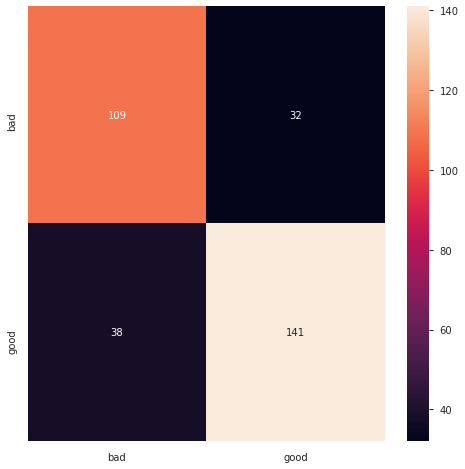

In [68]:
fig = plt.figure(figsize=(8,8))
ax = sns.heatmap(conf_mx, annot=True, fmt="d", 
                 xticklabels=final_model.classes_,
                 yticklabels=final_model.classes_,)

# Feature importances

In [69]:
feature_importances = final_model.feature_importances_
feature_importances

array([0.07097164, 0.10323173, 0.06387971, 0.05287201, 0.07146346,
       0.05552066, 0.10225365, 0.09875117, 0.06483852, 0.1333328 ,
       0.18288464])

In [70]:
sorted(zip(feature_importances, X_test.columns), reverse=True)

[(0.18288464279124658, 'alcohol'),
 (0.13333280087334554, 'sulphates'),
 (0.103231732333506, 'volatile acidity'),
 (0.10225365432826787, 'total sulfur dioxide'),
 (0.09875117216945486, 'density'),
 (0.071463462092692, 'chlorides'),
 (0.07097163703395568, 'fixed acidity'),
 (0.06483852167253831, 'pH'),
 (0.06387970685618904, 'citric acid'),
 (0.055520664583268306, 'free sulfur dioxide'),
 (0.052872005265535836, 'residual sugar')]

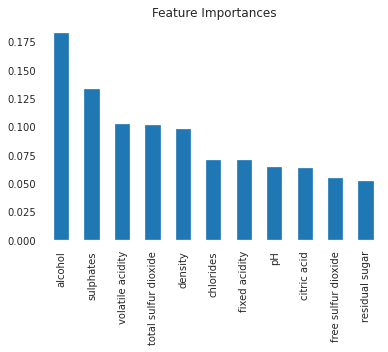

In [71]:
feature_imp = pd.Series(feature_importances, index=X_train.columns).sort_values(ascending=False)
feature_imp.plot(kind='bar')
plt.title('Feature Importances');

# Feature Selection

We are going to use RFECV to determine the number of valid features with cross-validation.

In [72]:
selector = RFECV(final_model, step=1, cv=StratifiedKFold())
selector = selector.fit(X_train, y_train)
pd.DataFrame({"Feature": predict_columns, "Support": selector.support_})

NameError: name 'RFECV' is not defined

In [ ]:
plt.figure()
plt.xlabel("No. of features selected")
plt.ylabel("Cross validation scores")
plt.plot(range(1, len(selector.grid_scores_) + 1), selector.grid_scores_)
plt.show()

In [ ]:
selector.grid_scores_

The conclusion is that all the variables are important for the model, since the maximum score is obtained with the 10 selected features.

## Conclusions

This analysis has addressed the issue as a problem of supervised learning binary classification. Our starting baseline, obtained from a classifier that always predicts the most frequent class, is the following:

+ Precision: **28%**
+ Recall: **53%**
+ Accuracy: **53%**
+ f1: **0.37**

After training various models, the one that has provided the best results is RandomForest. After fine-tuning the hyperparameters we obtain the following metrics:

+ Precision: **82%**
+ Recall: **82%**
+ Accuracy: **82%**
+ f1: **0.82**

The performance in the test set is as follows:

+ Precision: **78%**
+ Recall: **78%**
+ Accuracy: **78%**
+ f1: **0.78**

All predictor variables are relevant to the model. The three that most affect prediction are the following:

+ alcohol
+ sulphates
+ volatile acidity